In [1]:
using LinearAlgebra, Plots, StatsPlots

In [2]:
using DataFrames, CSV

In [3]:
data = CSV.read("PPO_hists_mt14_209.csv", DataFrame)
m_data = Matrix(data)

5000×20 Matrix{Float64}:
 -12.0      -12.0      -12.0      …  -12.0      -12.0      -12.0
   5.7541    -5.14527    1.3326        6.00138    8.90103    0.475256
   5.7541    -5.14527    1.3326        6.00138    8.90103    0.475256
   5.7541     5.6152     6.00138       6.00138    8.90103    0.475256
   5.7541     5.6152     6.00138       6.00138    8.90103    0.475256
   5.7541     5.6152     6.00138  …    6.00138    8.90103    6.00138
   5.7541     5.6152     6.00138       6.00138    8.90103    6.00138
   6.00138    6.00138    6.00138       6.00138    8.90103    6.00138
   6.00138    6.00138    6.00138       6.00138    8.90103    6.00138
   6.00138    6.00138    6.00138       6.00138    8.90103    6.00138
   6.00138    6.00138    6.00138  …    6.00138    8.90103    6.00138
   6.00138    6.00138    6.00138       6.00138    8.90103    6.00138
   6.00138    6.00138    6.00138       6.00138    8.90103    6.00138
   ⋮                              ⋱                        
   8.90103    8.90

In [4]:
data0 = CSV.read("./../AZP/hists_mt14_207.csv", DataFrame)
m_data0 = Matrix(data0)

6000×20 Matrix{Float64}:
 -12.0      -12.0      -12.0      …  -12.0      -12.0      -12.0
   5.9812     5.9812     1.33155       5.9812     5.9812     5.9812
   5.9812     8.90101    5.9812        5.9812     5.9812     5.9812
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101  …    8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101  …    8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   8.90101    8.90101    8.90101       8.90101    8.90101    8.90101
   ⋮                              ⋱                        
  11.3393    11.3393    

In [5]:
function matrix2vecdata(m_data)
    xin = size(m_data, 1)
    batch = size(m_data, 2)
    vec_data::Vector{Vector{Float32}} = []
    for x in 1:batch
        vd::Vector{Float32} = []
        for ld in 1:xin
            if(m_data[ld, x]==0)
                break
            end
            push!(vd, m_data[ld, x])
        end
        push!(vec_data, vd)
    end
    mean_v::Vector{Float32} = []
    #max_v::Vector{Float32} = []
    #min_v::Vector{Float32} = []
    #counts::Vector{Int} = []
    B = batch
    for ld in 1:xin
        mean = 0.0f0
        count = 0
        #max0 = -12.0f0
        #min0 = 12.0f0
        for data in m_data[ld, :]
            mean += data
            if(data!=0)
                count += 1
            end
            #=
            if(data>max0)
                max0 = data
            end
            if(data<min0)
                min0 = data
            end=#
        end
        #=if(count>10)
            push!(mean_v, (mean-min0-max0)/(count-2))
            push!(counts, count-2)
        else=#
            push!(mean_v, mean/count)
            #push!(counts, count)
        #end
        #push!(max_v, max0)
        #push!(min_v, min0)
    end
    
    p1 = plot(vec_data[1], color=1, legend=false, xaxis=:log,xticks=([1, 10, 100, 1000]), yrange=(6, 12), lw = 1.0, gridwidth=2.0)
    for d in 2:batch
        p1 = plot!(vec_data[d], color=1, legend=false, lw = 1.0)
    end
    p1 = plot!(mean_v, color=:red, lw = 3)
    #p1 = plot!(counts./2, color=3, lw = 2)
    #p1 = plot!(max_v, color=4, lw = 2)
    #p1 = plot!(min_v, color=4, lw = 2)
    return p1
end

matrix2vecdata (generic function with 1 method)

In [6]:
function matrix2vecdata_v(m_data)
    xin = size(m_data, 1)
    batch = size(m_data, 2)
    vec_data::Vector{Vector{Float32}} = []
    for x in 1:batch
        vd::Vector{Float32} = []
        for ld in 1:xin
            if(m_data[ld, x]==0)
                break
            end
            push!(vd, m_data[ld, x])
        end
        push!(vec_data, vd)
    end
    mean_v::Vector{Float32} = []
    #max_v::Vector{Float32} = []
    #min_v::Vector{Float32} = []
    #counts::Vector{Int} = []
    B = batch
    for ld in 1:xin
        mean = 0.0f0
        count = 0
        #max0 = -12.0f0
        #min0 = 12.0f0
        for data in m_data[ld, :]
            mean += data
            if(data!=0)
                count += 1
            end
            #=
            if(data>max0)
                max0 = data
            end
            if(data<min0)
                min0 = data
            end=#
        end
        #=if(count>10)
            push!(mean_v, (mean-min0-max0)/(count-2))
            push!(counts, count-2)
        else=#
            push!(mean_v, mean/count)
            #push!(counts, count)
        #end
        #push!(max_v, max0)
        #push!(min_v, min0)
    end
    
    p1 = plot(vec_data[1], color=1, legend=false, xaxis=:log,xticks=([1, 10, 100, 1000]), yrange=(6, 12), lw = 1.0, gridwidth=2.0)
    for d in 2:batch
        p1 = plot!(vec_data[d], color=1, legend=false, lw = 1.0)
    end
    p1 = plot!(mean_v, color=:red, lw = 3)
    #p1 = plot!(counts./2, color=3, lw = 2)
    #p1 = plot!(max_v, color=4, lw = 2)
    #p1 = plot!(min_v, color=4, lw = 2)
    return p1, mean_v
end

matrix2vecdata_v (generic function with 1 method)

In [7]:
Plots.scalefontsizes(1.3)

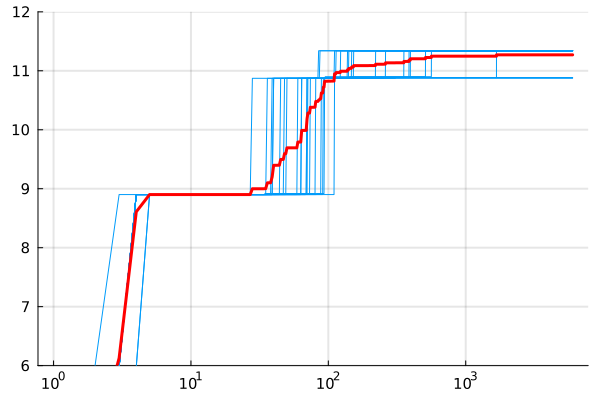

In [9]:
p0, v0 = matrix2vecdata_v(m_data0)
p0

In [12]:
p = matrix2vecdata(m_data)
p = plot!(v0, linewidth=3, color=:grey, legend=false)
savefig(p, "hists_mt14_209_ave20_PPO_vs_AZfP.pdf")

"/home/yoshihiro/Documents/Codes/julia/AlphaZeroForPhysics/PPO/hists_mt14_209_ave20_PPO_vs_AZfP.pdf"

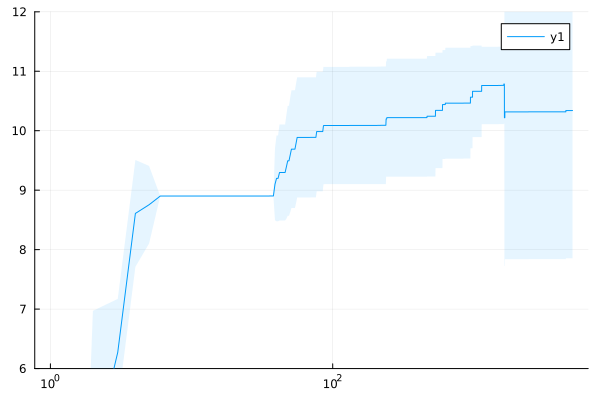

In [17]:
p1 = errorline(1:5000, m_data'[:, 1:5000], errorstyle =:ribbon, yrange=(6, 12), xaxis=:log)

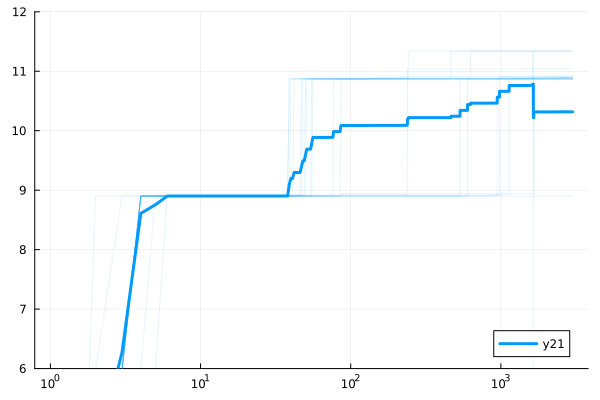

In [16]:
p1 = errorline(1:3000, m_data'[:, 1:3000], errorstyle =:plume,xaxis=:log,xticks=([1, 10, 100, 1000]), yrange=(6, 12))

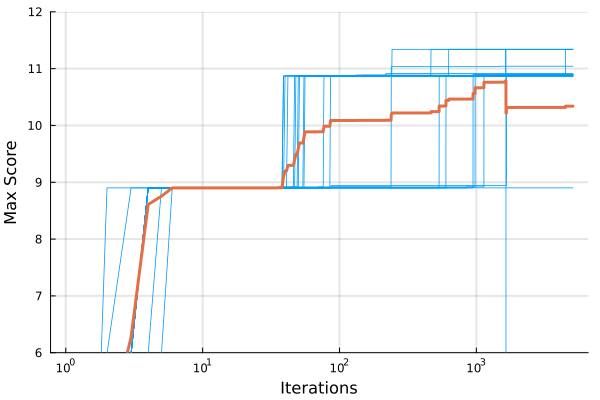

In [14]:
meand1 = mean(m_data, dims=2)
p3=plot(m_data, color=1, legend=false, xaxis=:log,xticks=([1, 10, 100, 1000]), yrange=(6, 12), lw = 0.8)
p3=plot!(meand1, color=2, lw = 3.0, xlabel="Iterations", ylabel="Max Score", gridwidth=2.0)

In [45]:
savefig(p3, "hists_mt14_117.pdf")

"/home/yoshihiro/Documents/Codes/julia/AlphaZeroForPhysics/AZP/hists_mt14_117.pdf"

In [8]:
using StatsBase

In [28]:
meand = mean(m_data2, dims=2)

2000×1 Matrix{Float64}:
 -12.0
   3.65637805
   5.981202600000001
   8.463038079999999
   8.609028399999998
   8.901008999999998
   8.901008999999998
   8.901008999999998
   8.901008999999998
   8.901008999999998
   8.901008999999998
   8.901008999999998
   8.901008999999998
   ⋮
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001
  11.082838800000001

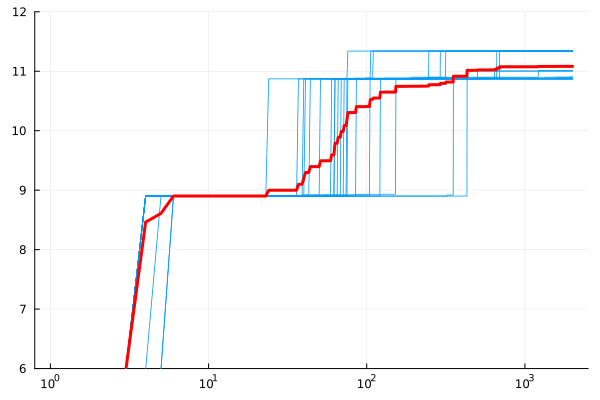

In [38]:
plot(m_data2, color=1, legend=false, xaxis=:log,xticks=([1, 10, 100, 1000]), yrange=(6, 12), lw = 0.8)
plot!(meand, color=:red, lw = 3.0)

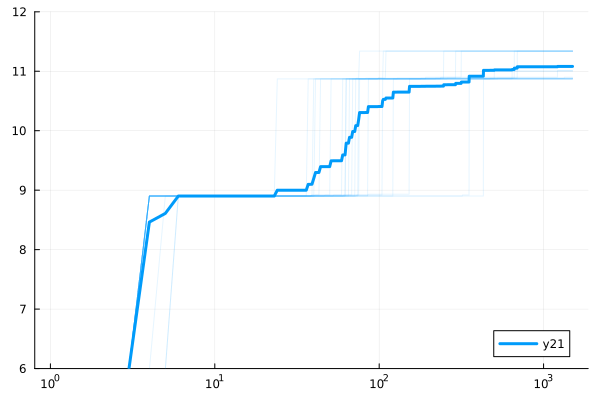

In [25]:
data2 = CSV.read("hists_mt14_120.csv", DataFrame)
m_data2 = Matrix(data2)
p2 = errorline(1:1500, m_data2'[:, 1:1500], errorstyle =:plume,xaxis=:log,xticks=([1, 10, 100, 1000]), yrange=(6, 12), scondarycolor=:red)

In [27]:
using Distributed

In [28]:
addprocs(3)

3-element Vector{Int64}:
 2
 3
 4

In [35]:
using SharedArrays

In [36]:
vs = SharedArray(zeros(Float32, 3))

3-element SharedVector{Float32}:
 0.0
 0.0
 0.0

In [37]:
@distributed for i in 1:3
    vs[i] = i
end

Task (runnable) @0x00007fe1dabf9140

In [38]:
vs

3-element SharedVector{Float32}:
 1.0
 2.0
 3.0

In [40]:
vss = Vector(vs)

3-element Vector{Float32}:
 1.0
 2.0
 3.0